<i>Integrantes do grupo:

- Alfredo Henrique, RM 83993
- Gabriel Fellone, RM 82012
- Lais Campitelli, RM 76134
- Leandro Rocha, RM 84378
- Leticia Bora, RM 82071
- Renan Miyamoto, RM 81348
</i>

# Quem ama cuida
### <i>E quem cuida precisa saber como</i>

<br>
 Diante dessa crise mundial de saúde, que afetou diversas áreas da nossa vida, muitos planos tiveram que ser revistos. Agendas tiveram que ser alteradas. Atividades tiveram que ser readaptadas. 
 
 Pensando nesse cenário, fomos desafiados a desenvolver uma solução que garanta o <b>bem estar dos idosos</b>, especialmente durante o período de <i><u>quarentena</u></i>. Já existem incontáveis soluções para serviços básicos como saúde e alimentação, tudo que pensamos em produzir nessas áreas seria mais do mesmo. Portanto, optamos por pensar em uma ferramenta realmente relevante para a saúde mental e emocional do nosso público-alvo.
 
 Para isso, criamos o app <b>Velho Hábito</b>. O objetivo é que ele seja uma rede em que os idosos possam trocar ideias sobre seus hobbies, além de fazer amizades. O aplicativo foi pensado com a finalidade de distraí-los e fazer com que não se sintam sozinhos, principalmente na situação em que nos encontramos, onde eles têm pouco ou nenhum contato com a família e amigos por serem grupo de risco.

 <i>Talvez você pense: "QUÊ!? Isso é mesmo relevante?"</i>
 
 Hobbies para idosos certamente não é a primeira coisa que vem à cabeça quando se fala em garantir o bem estar dos nossos amados velhinhos, mas nesse momento é muito importante que eles possuam alternativas para interagir e ocupar a cabeça. Sendo assim, nosso foco é que eles possam ter dicas sobre atividades que mais gostam, tirar dúvidas e fazer amizades.
 
 O aplicativo contém alguns hobbies pré definidos (como jardinagem, artesanato e meditação), com a possibilidade do usuário criar novos hobbies dentro do app. Algumas telas dele são:

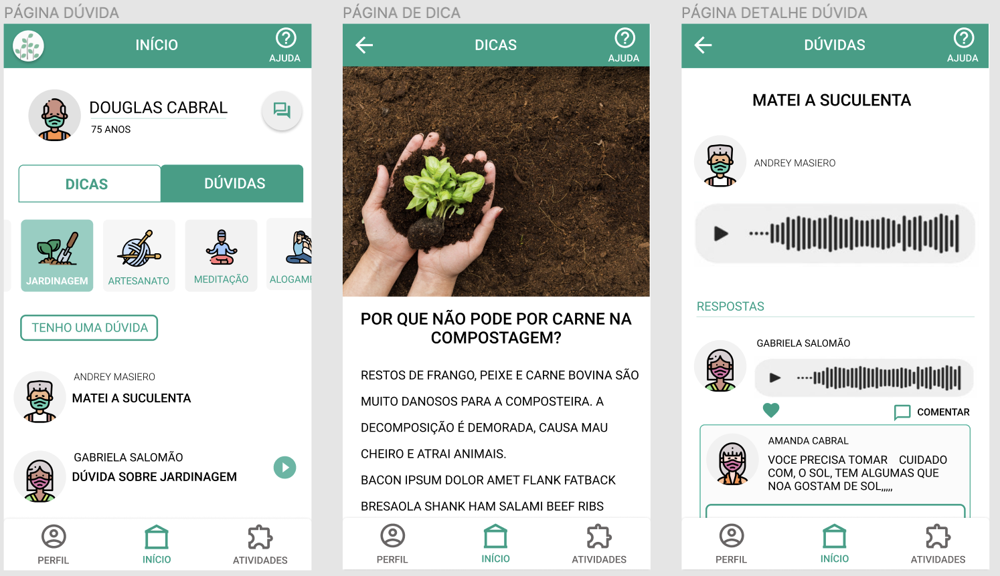

## IA & Machine Learning

 Para otimizar a nossa aplicação, nós decidimos - <i>com toda a nossa experiência de seis meses como alunos de IA</i> - usar a inteligência artificial para implementar um sistema de reconhecimento de flores. Esse recurso é muito relevante, pois cada espécie necessita de cuidados específicos. E muitas pessoas acabam matando suas flores por não saberem os cuidados que cada uma requer.
 
 Funcionaria assim: o usuário encaminharia a foto de uma flor para o nosso app, a foto seria comparada com as imagens do nosso acervo e, após a identificação, o app retornaria o nome daquela flor, e a partir dessa informação o usuário poderia pesquisar o intervalo de tempo ideal para regá-la e a temperatura mais adequada para ela. Numa versão melhorada, a gente pode retornar essas informações para o usuário.
 
 Dessa forma, o usuário saberá exatamente os cuidados que precisa ter com cada flor. As flores, agora bem cuidadas, certamente ficarão mais bonitas. E isso aumentará muito a auto-estima do idoso.
 
 Pesquisamos, estudamos e vimos que nós poderíamos desenvolver nosso sistema de reconhecimento de flores com o <b>Deep Learning</b>.

<i> O QUE É DEEP LEARNING?</i>

 Deep Learning é um subcampo de <u>Machine Learning</u>. É uma área concentrada em algoritmos, estruturas e funções cerebrais chamadas Neural Networks, ou <b>Redes Neurais</b>.

 A ideia é simular o modo como nós, seres humanos, entendemos as coisas e chegamos a uma determinada conclusão. Reproduzindo nossos métodos de aprendizagem.

 Usando redes neurais e preditivas, o Deep Learning ensina ao computador como entender, para depois conseguir prever alguns padrões. Para isso, se utiliza de um grande volume de dados. Quanto melhor forem os dados, mais assertivo será o resultado final.
 
 A grosso modo, o Deep Learning pode ser dividido em três partes. A primeira é o INPUT LAYER (camada de entrada), onde são passados os dados que servirão de base para as análises. A segunda parte, intermediária, é a análise das HIDDEN LAYERS (camadas ocultas), que se trata basicamente de métodos que guiam o aprendizado do modelo a partir do conjunto de dados. A terceira parte é o OUTPUT LAYER (camada de saída), em que será retornada uma representação adequada para o problema em questão.

A imagem a seguir ilustra esse processo. . .

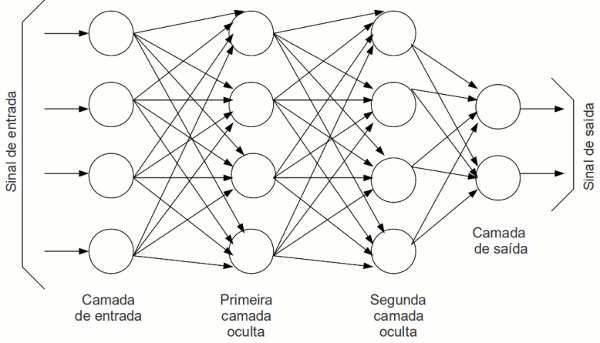

 No nosso caso, precisamos de um dataset de imagens de flores que sirvam de base para o sistema de reconhecimento das flores. Encontramos o dataset <a href= "https://www.kaggle.com/msheriey/104-flowers-garden-of-eden">104 Flowers: Garden of Eden</a> no Kaggle e decidimos utilizá-lo.
 
 Vamos dar uma olhadinha nesse dataset. . .

### Lendo os arquivos

Para ler os arquivos da nossa base de dados, precisamos importar algumas bibliotecas, acessar o endereço em que eles estão armazenados e retornar de forma organizada. . .

In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

In [2]:
DATASET_DIR = '../data/jpeg-512x512'
TRAIN_DIR  = '../data/jpeg-512x512/train'

In [3]:
FLOWER_NAMES = []

FLOWER_TRAIN_FILEPATHS = {}

for root, dir_names, _ in os.walk(TRAIN_DIR):
    
    for dir_name in dir_names:
        FLOWER_NAMES.append(dir_name)
        FLOWER_TRAIN_FILEPATHS[dir_name] = []
        
        for dir_root, _, dir_filenames in os.walk(os.path.join(root, dir_name)):            
            
            for filename in dir_filenames: 
                FLOWER_TRAIN_FILEPATHS[dir_name].append(os.path.join(dir_root, filename))

### Nomes das Flores

Agora nós podemos ver os nomes das flores do dataset, mas antes vamos dar uma olhada na quantidade que temos:

In [4]:
print('len(FLOWER_NAMES): ', len(FLOWER_NAMES))

len(FLOWER_NAMES):  10


Temos 10 flores na base. Originalmente, o dataset contém 104 flores, com diversas imagens cada. Isso faz com que seu tamanho seja muito grande. Como o propósito deste notebook é apenas mostrar a nossa ideia, nós deixamos apenas algumas imagens na nossa base, para servir de exemplo.

Agora sim, vamos ver em lista os nomes das flores que temos:

In [5]:
FLOWER_NAMES

['balloon flower',
 'camellia',
 'bird of paradise',
 'trumpet creeper',
 'azalea',
 'yellow iris',
 'bee balm',
 'blackberry lily',
 'lotus',
 'magnolia']

### Navegação

Também podemos entrar em cada flor e ver os arquivos jpeg que estão lá dentro. Por exemplo, se quisermos saber quais arquivos estão na <b>MAGNOLIA</b>:

In [6]:
FLOWER_TRAIN_FILEPATHS['magnolia']

['../data/jpeg-512x512/train/magnolia/4384.jpeg',
 '../data/jpeg-512x512/train/magnolia/4862.jpeg',
 '../data/jpeg-512x512/train/magnolia/8891.jpeg',
 '../data/jpeg-512x512/train/magnolia/11314.jpeg',
 '../data/jpeg-512x512/train/magnolia/10076.jpeg',
 '../data/jpeg-512x512/train/magnolia/9434.jpeg',
 '../data/jpeg-512x512/train/magnolia/11551.jpeg',
 '../data/jpeg-512x512/train/magnolia/11645.jpeg',
 '../data/jpeg-512x512/train/magnolia/12211.jpeg',
 '../data/jpeg-512x512/train/magnolia/7269.jpeg',
 '../data/jpeg-512x512/train/magnolia/4616.jpeg',
 '../data/jpeg-512x512/train/magnolia/9203.jpeg',
 '../data/jpeg-512x512/train/magnolia/5168.jpeg',
 '../data/jpeg-512x512/train/magnolia/10344.jpeg',
 '../data/jpeg-512x512/train/magnolia/8722.jpeg',
 '../data/jpeg-512x512/train/magnolia/11268.jpeg',
 '../data/jpeg-512x512/train/magnolia/1927.jpeg',
 '../data/jpeg-512x512/train/magnolia/10418.jpeg',
 '../data/jpeg-512x512/train/magnolia/11424.jpeg',
 '../data/jpeg-512x512/train/magnolia/928

Ou se quisermos saber quais arquivos estão em <b>CAMELLIA</b>:

In [7]:
FLOWER_TRAIN_FILEPATHS['camellia']

['../data/jpeg-512x512/train/camellia/8395.jpeg',
 '../data/jpeg-512x512/train/camellia/9879.jpeg',
 '../data/jpeg-512x512/train/camellia/581.jpeg',
 '../data/jpeg-512x512/train/camellia/1665.jpeg',
 '../data/jpeg-512x512/train/camellia/5380.jpeg',
 '../data/jpeg-512x512/train/camellia/5840.jpeg',
 '../data/jpeg-512x512/train/camellia/9267.jpeg',
 '../data/jpeg-512x512/train/camellia/5649.jpeg',
 '../data/jpeg-512x512/train/camellia/12414.jpeg',
 '../data/jpeg-512x512/train/camellia/12372.jpeg',
 '../data/jpeg-512x512/train/camellia/6896.jpeg',
 '../data/jpeg-512x512/train/camellia/4537.jpeg',
 '../data/jpeg-512x512/train/camellia/3896.jpeg',
 '../data/jpeg-512x512/train/camellia/7561.jpeg',
 '../data/jpeg-512x512/train/camellia/5061.jpeg',
 '../data/jpeg-512x512/train/camellia/2121.jpeg',
 '../data/jpeg-512x512/train/camellia/6321.jpeg',
 '../data/jpeg-512x512/train/camellia/6809.jpeg',
 '../data/jpeg-512x512/train/camellia/6061.jpeg',
 '../data/jpeg-512x512/train/camellia/7303.jpeg',

### Foto das Flores

Finalmente, vamos dar uma olhada nas imagens em si. . .

In [8]:
def grow_flowers(flower_type, sample_size=5):
    flowers = [Image.open(flower).convert('RGB') for flower in random.sample(FLOWER_TRAIN_FILEPATHS[flower_type], sample_size)]
                
    n_flowers = len(flowers)
    
    figure = plt.figure()
    for i, flower in enumerate(flowers):
        figure.add_subplot(1, np.ceil(n_flowers), i + 1)
        plt.axis('off')
        plt.imshow(flower)
        
    figure.set_size_inches(np.array(figure.get_size_inches()) * n_flowers)
    
    plt.show()

balloon flower


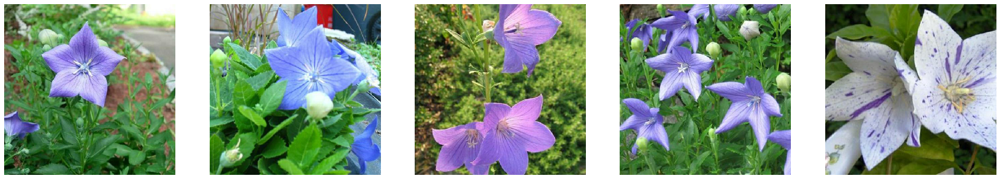

camellia


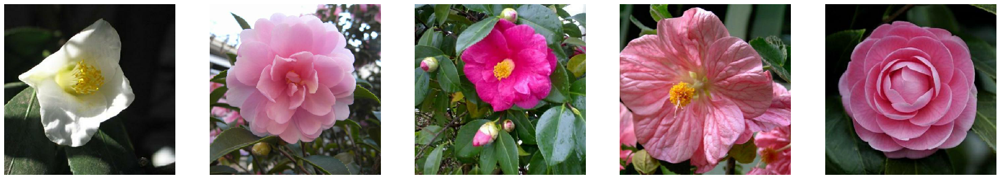

bird of paradise


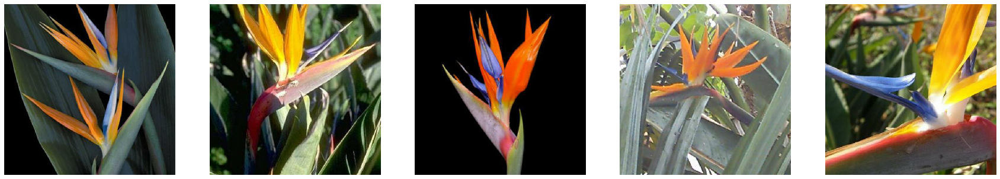

trumpet creeper


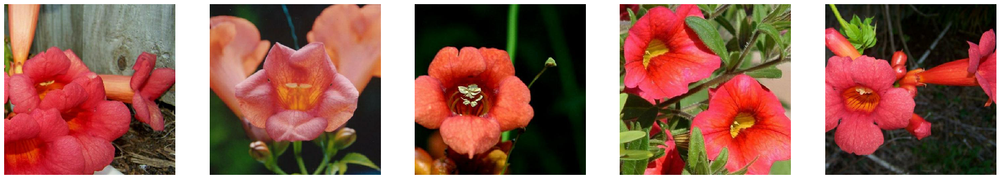

azalea


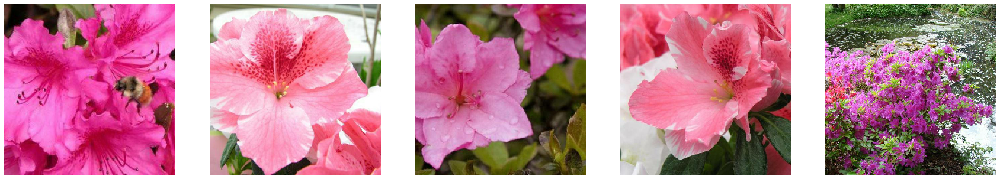

yellow iris


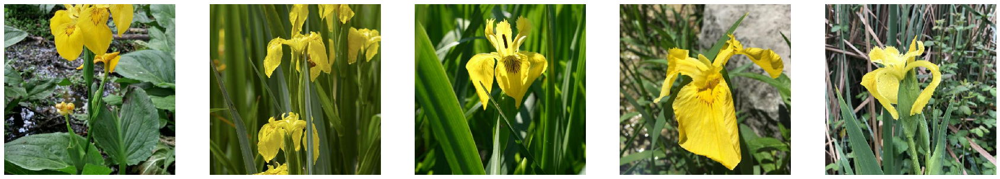

bee balm


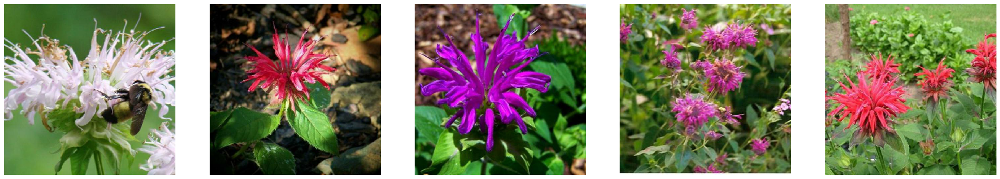

blackberry lily


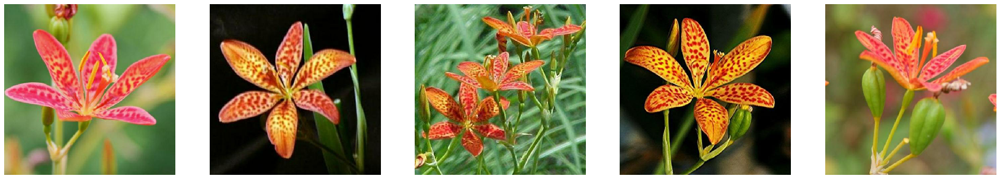

lotus


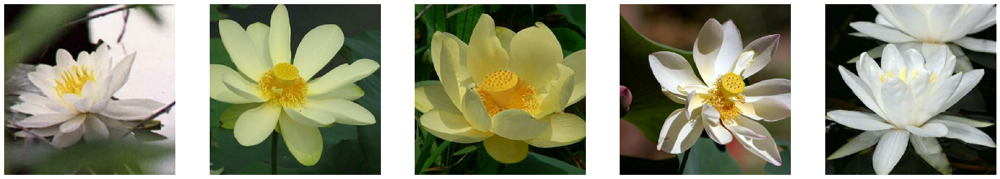

magnolia


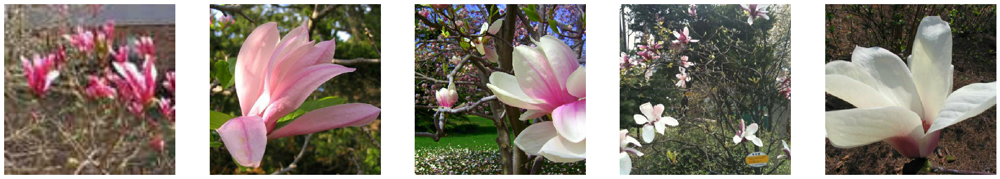

In [9]:
for flower_name in FLOWER_NAMES:
    print(flower_name)
    grow_flowers(flower_name)

 Agora que temos o nosso dataset, nós <i><u>poderíamos</u></i> avançar para as próximas etapas. . .
 
 A gente ia precisar de um framework para isso, e talvez alguma outra biblioteca para manipular as imagens, como a <i>scipy</i>. Um framework de Deep Learning que chamou bastante a nossa atenção foi o Keras, que é em código aberto para Python.
 
 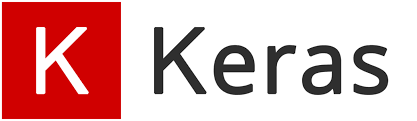

<br>
 <b>MAS. . .</b>
 
 Pois é, nós <b><i>PODERÍAMOS</i></b> avançar para as próximas etapas e desenvolver esse sistema tão interessante de reconhecimento das flores. Mas no momento esse desafio é muito avançado para nós. . . 
 
 Esse trabalho fez a gente entender melhor o poder do Deep Learning, e enxergar com mais clareza o modo como ele está ocupando espaço na sociedade, em diversos serviços. Seja na identificação de emoções que determinados textos carregam (método utilizado pela Amazon para medir a satisfação de seus clientes) ou no diagnóstico de uma doença.
 
 Aprendemos muito com as pesquisas e estamos bastante animados com nossa ideia. A proposta de ajudar os velhinhos no cuidado de suas flores nos agrada bastante. É bem possível que no futuro a gente dê continuidade a ela.
 
 Por enquanto, é isso. Ficamos por aqui.
 
 <b>Até a próxima!</b>